### Problem Statement

The data scientists at BigMart have collected 2013 sales data for 1559 products across 10 stores in different cities. Also, certain attributes of each product and store have been defined. The aim of this data science project is to build a predictive model and find out the sales of each product at a particular store.
Using this model, BigMart will try to understand the properties of products and stores which play a key role in increasing sales.

### Hypothesis Generation

Let's develop a hypothesis based on the domain knowledge of 'Sales' that could have an impact in predicting and solving the business problem that BigMart is facing. Sales is the most crucial metric of any business; every business needs to sell its product in the market to increase profitability, revenue etc and gain an edge over their competitors. There are various factors that can affect the sales of BigMart:

1. Quantity sold of each product in every store: With an increase in the quantity sold of every product in all the 10 stores, we can say that the overall sales will increase


2. Demand for products at a particular city: There might be some products for which demand is exceptionally high in a particular city, hence for those products, due to high demand sales tends to increase, whereas products for which there is no demand will face a decline in sales.


3. Product attributes and features: If the products have good features then customers will be satisfied therefore more sales will be generated.


4. Pricing of the products: There is an inverse relation between price of the product and sales. High price leads to low sales and vice versa.


5. Marketing and advertising: Stronger the marketing strategy, higher will be the sales.


6. Location: Cities where people are rich such as in tier-1 cities, sales would be more as consumers will spend more to buy more products.


7. Customer type/demographic factors : Customers having age between 50-60 won't purchase products such as frozen foods(due to risk of diseases), hence leads to lower sales. Customers who are fitness freaks might have left dairy products in their diet, therefore they won't purchase such products.

In [1]:
## Loading the necessary libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go

In [2]:
## Importing the dataset

df=pd.read_csv('C:\\Python\\Train.csv') ## Reading the dataset using pandas csv method
df.head() ## Getting the top 5 records

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [3]:
df.info() ## Basic structure and information about the data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


#### There are around 8,523 observations in the dataset. There are 4 observations which are of float, 1 observation of integer and 7 observations are of object type.

In [4]:
df.describe() ## Summary statistics of the dataset

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


### Missing Values treatment

In [5]:
vars_na=[var for var in df.columns if df[var].isnull().sum()>0] ## Getting the columns having missing data
vars_na

['Item_Weight', 'Outlet_Size']

In [6]:
df.isnull().sum() ## Finding number of missing values

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [7]:
df['Item_Weight'].dtype ## Checking the data type

dtype('float64')

In [8]:
df['Outlet_Size'].dtype

dtype('O')

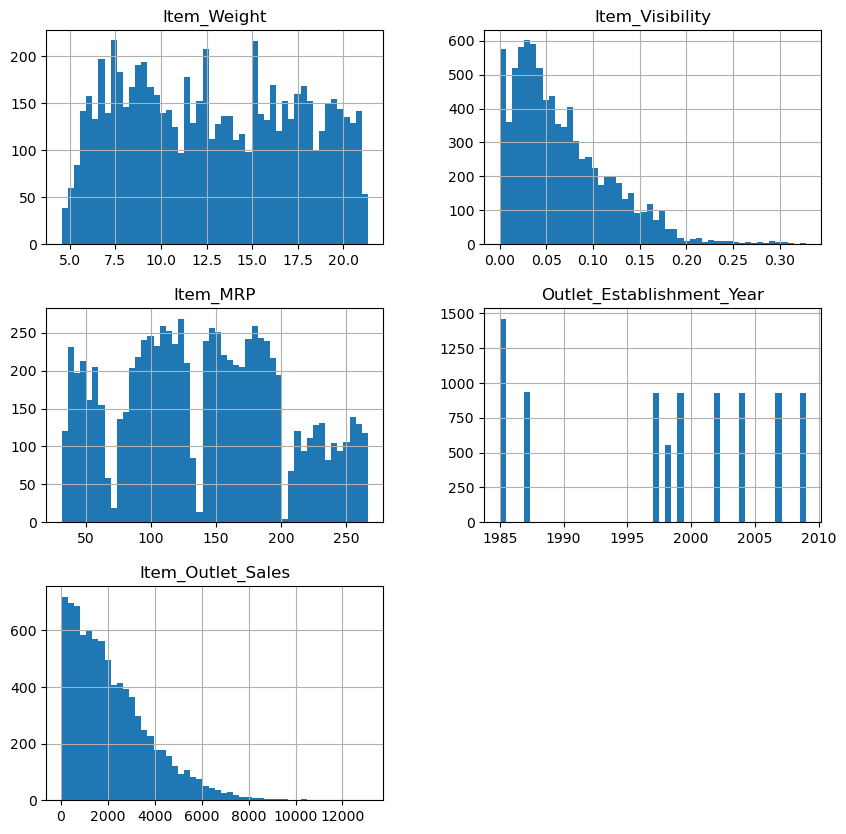

In [9]:
df.hist(bins=50,figsize=(10,10)) ## Plotting histograms of the data before imputing nan values
plt.show()

In [10]:
## Importing the libraries for handling missing values
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split

In [11]:
X_train,X_test,y_train,y_test=train_test_split(
    df.drop('Item_Outlet_Sales',axis=1), ## independent features
    df['Item_Outlet_Sales'], ## dependent feature
    test_size=0.3, ## 30% of the data goes for testing and remaining 70% for training
    random_state=0 ## for reproducibility
)

X_train.shape,X_test.shape ## Number of records present in train and test data individually

((5966, 11), (2557, 11))

In [12]:
imputer=ColumnTransformer(

    transformers=[
        ('mean_imputer',SimpleImputer(strategy='mean'),['Item_Weight']), ## imputing nan with mean
        ('mode_imputer',SimpleImputer(strategy='most_frequent'),['Outlet_Size']), ## imputing nan with mode
    ],
    remainder='passthrough' ## show all the variables which are modified as well as not modified
)

In [13]:
imputer.set_output(transform='pandas') ## transforming the result into a pandas dataframe

ColumnTransformer(remainder='passthrough',
                  transformers=[('mean_imputer', SimpleImputer(),
                                 ['Item_Weight']),
                                ('mode_imputer',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['Outlet_Size'])])

In [14]:
imputer.fit(X_train) ## fitting the results on training set

ColumnTransformer(remainder='passthrough',
                  transformers=[('mean_imputer', SimpleImputer(),
                                 ['Item_Weight']),
                                ('mode_imputer',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['Outlet_Size'])])

In [15]:
imputer.transformers ## Our transformers for which modification is required

[('mean_imputer', SimpleImputer(), ['Item_Weight']),
 ('mode_imputer', SimpleImputer(strategy='most_frequent'), ['Outlet_Size'])]

In [16]:
imputer.named_transformers_['mean_imputer'].statistics_ ## getting the mean of numerical variable

array([12.9298726])

In [17]:
imputer.named_transformers_['mode_imputer'].statistics_ ## getting the mode for categorical variable

array(['Medium'], dtype=object)

In [18]:
X_train=imputer.transform(X_train) ## replacing the nan values with the above imputation techniques on train set
X_test=imputer.transform(X_test)   ## replacing the nan values with the above imputation techniques on test set

In [19]:
X_train.isnull().mean() ## No missing values

mean_imputer__Item_Weight               0.0
mode_imputer__Outlet_Size               0.0
remainder__Item_Identifier              0.0
remainder__Item_Fat_Content             0.0
remainder__Item_Visibility              0.0
remainder__Item_Type                    0.0
remainder__Item_MRP                     0.0
remainder__Outlet_Identifier            0.0
remainder__Outlet_Establishment_Year    0.0
remainder__Outlet_Location_Type         0.0
remainder__Outlet_Type                  0.0
dtype: float64

In [20]:
X_train.head()

,mean_imputer__Item_Weight,mode_imputer__Outlet_Size,remainder__Item_Identifier,remainder__Item_Fat_Content,remainder__Item_Visibility,remainder__Item_Type,remainder__Item_MRP,remainder__Outlet_Identifier,remainder__Outlet_Establishment_Year,remainder__Outlet_Location_Type,remainder__Outlet_Type
88,6.305000,Small,FDN33,Regular,0.123116,Snack Foods,95.6436,OUT046,1997,Tier 1,Supermarket Type1
6813,5.980000,Medium,FDY31,Low Fat,0.043809,Fruits and Vegetables,146.8418,OUT017,2007,Tier 2,Supermarket Type1
4046,12.929873,Medium,NCH54,Low Fat,0.072317,Household,160.7920,OUT027,1985,Tier 3,Supermarket Type3
8194,12.929873,Small,FDY15,Regular,0.299098,Dairy,157.8630,OUT019,1985,Tier 1,Grocery Store
8293,9.100000,Small,NCT30,Low Fat,0.080278,Household,47.2718,OUT035,2004,Tier 2,Supermarket Type1


In [21]:
X_test.head()

,mean_imputer__Item_Weight,mode_imputer__Outlet_Size,remainder__Item_Identifier,remainder__Item_Fat_Content,remainder__Item_Visibility,remainder__Item_Type,remainder__Item_MRP,remainder__Outlet_Identifier,remainder__Outlet_Establishment_Year,remainder__Outlet_Location_Type,remainder__Outlet_Type
4931,14.500000,Medium,NCS53,Low Fat,0.089960,Health and Hygiene,159.5604,OUT045,2002,Tier 2,Supermarket Type1
4148,12.929873,Medium,FDF58,Low Fat,0.009535,Snack Foods,64.5510,OUT027,1985,Tier 3,Supermarket Type3
7423,11.500000,Medium,NCM29,Low Fat,0.017742,Health and Hygiene,129.6626,OUT017,2007,Tier 2,Supermarket Type1
4836,10.195000,Medium,FDM40,Low Fat,0.000000,Frozen Foods,143.1154,OUT017,2007,Tier 2,Supermarket Type1
944,21.000000,High,FDH10,Low Fat,0.049264,Snack Foods,195.0478,OUT013,1987,Tier 3,Supermarket Type1


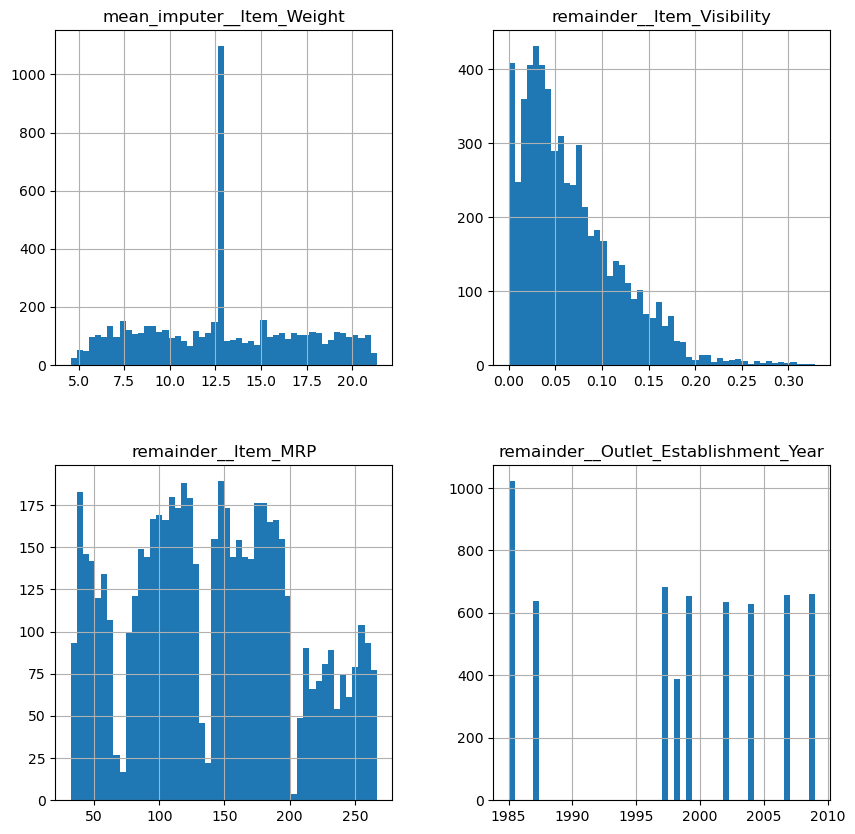

In [22]:
X_train.hist(bins=50,figsize=(10,10)) ## Histogram after imputing nan values
plt.show()

In [23]:
## Making copy of the training and testing datasets
df_1=X_train.copy()
df_2=X_test.copy()
df_3=y_train.copy()
df_4=y_test.copy()

In [24]:
df_merged_train=pd.concat([df_1,df_2],axis=0) ## merging the training sets by rows

In [25]:
df_merged_test=pd.concat([df_3,df_4],axis=0) ## merging the test sets by rows

In [26]:
final_df=pd.concat([df_merged_train,df_merged_test],axis=1) ## merging the final train and final test sets by column
final_df.head() 

,mean_imputer__Item_Weight,mode_imputer__Outlet_Size,remainder__Item_Identifier,remainder__Item_Fat_Content,remainder__Item_Visibility,remainder__Item_Type,remainder__Item_MRP,remainder__Outlet_Identifier,remainder__Outlet_Establishment_Year,remainder__Outlet_Location_Type,remainder__Outlet_Type,Item_Outlet_Sales
88,6.305000,Small,FDN33,Regular,0.123116,Snack Foods,95.6436,OUT046,1997,Tier 1,Supermarket Type1,661.8052
6813,5.980000,Medium,FDY31,Low Fat,0.043809,Fruits and Vegetables,146.8418,OUT017,2007,Tier 2,Supermarket Type1,1765.7016
4046,12.929873,Medium,NCH54,Low Fat,0.072317,Household,160.7920,OUT027,1985,Tier 3,Supermarket Type3,3675.2160
8194,12.929873,Small,FDY15,Regular,0.299098,Dairy,157.8630,OUT019,1985,Tier 1,Grocery Store,469.3890
8293,9.100000,Small,NCT30,Low Fat,0.080278,Household,47.2718,OUT035,2004,Tier 2,Supermarket Type1,850.8924


### Exploratory Data Analysis

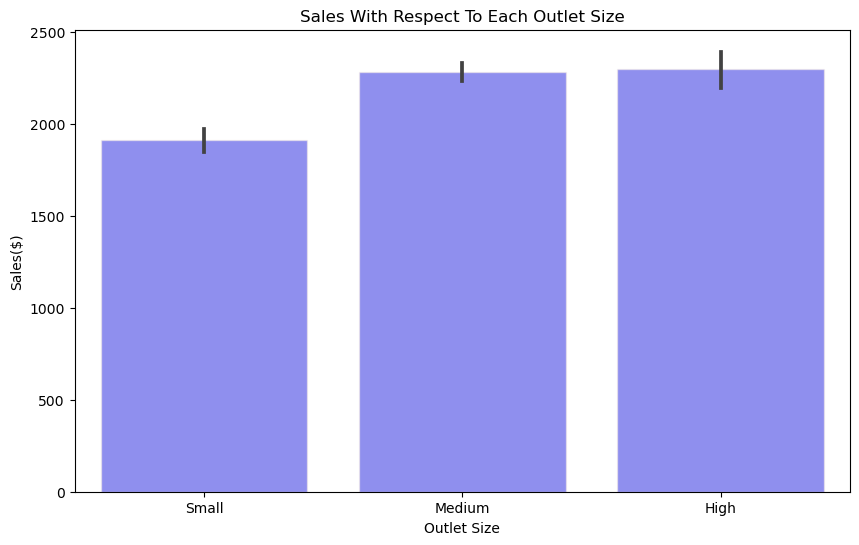

In [27]:
plt.figure(figsize=(10,6)) ## giving figure size
sns.barplot(data=final_df,x='mode_imputer__Outlet_Size',y='Item_Outlet_Sales',
           color='blue',edgecolor='linen',alpha=0.5) ## making a barplot
plt.title('Sales With Respect To Each Outlet Size') ## giving title
plt.xlabel('Outlet Size') ## naming the label of x-axis
plt.ylabel('Sales($)')## naming the label of y-axis
plt.show()

#### Maximum sales are coming from the outlets which are medium and high in size. Small sized outlets are generating very less sales. High and medium sized outlets are generating sales worth 2300 dollars and small sized outlets are generating sales worth 1800 dollars.

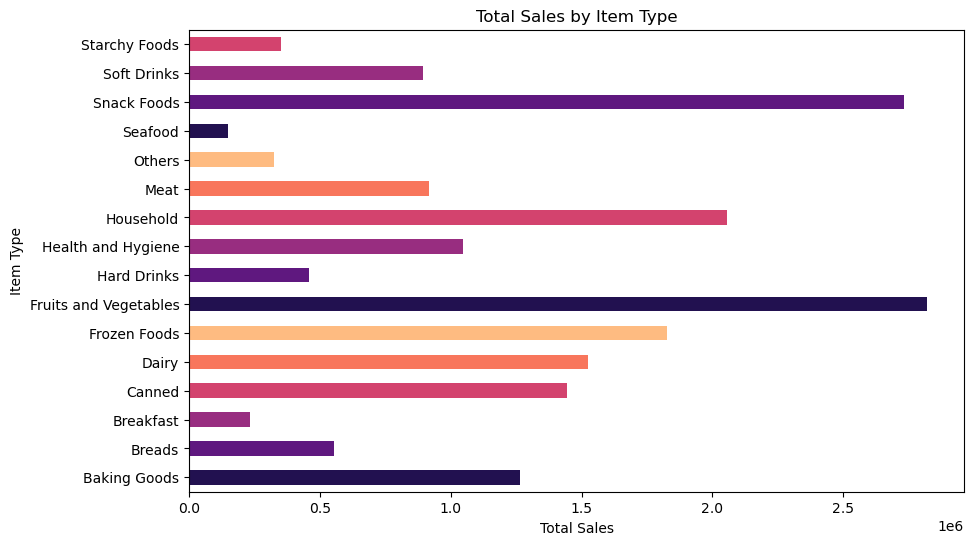

In [28]:
## Grouping the data of item type by total sales and plotting the results on a bar graph
sales_item_type=final_df.groupby(['remainder__Item_Type'])['Item_Outlet_Sales'].sum().plot(kind='barh',figsize=(10,6),
                                                                                          color=sns.color_palette('magma'))
sales_item_type.set_xlabel('Total Sales')
sales_item_type.set_ylabel('Item Type')
sales_item_type.set_title('Total Sales by Item Type')
plt.show()

#### Snack foods and fruits and vegetables are among the highest selling Item type. Seafood and Breakfast are among the lowest selling Item type.

In [29]:
top_sales=final_df.groupby(['remainder__Item_Type'])['Item_Outlet_Sales'].sum().reset_index() ## grouping the data of item type
## by total sales

In [30]:
top_item_type=top_sales.sort_values('Item_Outlet_Sales',ascending=False).head(5) ## sorting the values by desending order to 
## get the top 5 records

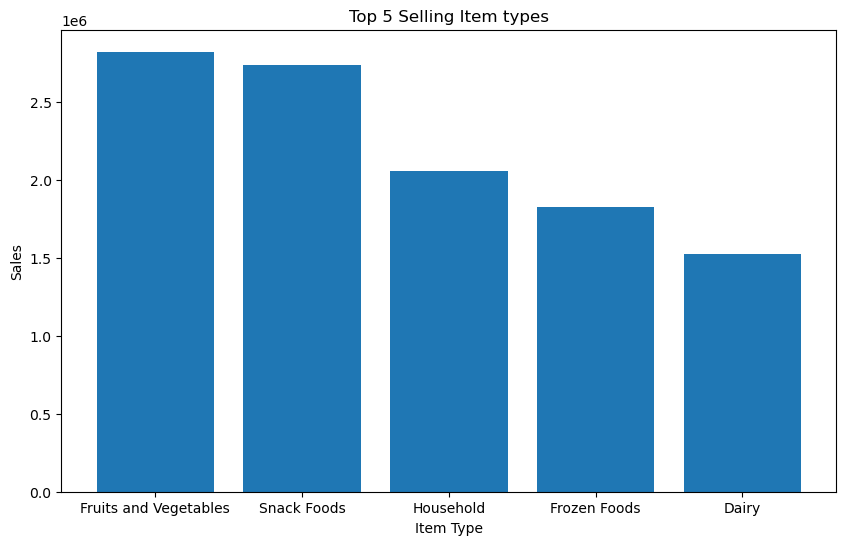

In [31]:
## Plotting the top 5 selling items
plt.figure(figsize=(10,6))
plt.bar(top_item_type['remainder__Item_Type'],top_item_type['Item_Outlet_Sales'])
plt.xlabel('Item Type')
plt.ylabel('Sales')
plt.title('Top 5 Selling Item types')
plt.show()

#### Fruits/vegetables, snack foods, household items, frozen foods and dairy products are the top 5 selling categories for the outlet

In [32]:
color=['blue','red','yellow'] ## giving color for pie chart
fig=go.Figure(go.Pie(labels=final_df['remainder__Outlet_Location_Type'],values=final_df['Item_Outlet_Sales'],
                    title='Sales by Cities')) ## plotting the pie chart with labels and values
fig

#### Highest Sales are coming from tier-3 cities and lowest sales are coming from tier-1 cities

In [33]:
color=['blue','red','yellow']
fig=go.Figure(go.Pie(labels=final_df['remainder__Outlet_Type'],values=final_df['Item_Outlet_Sales'],
                    title='Sales by Outlet Type'))
fig

#### 70% sales are coming from supermarket type-1, which means this store has captured the whole market

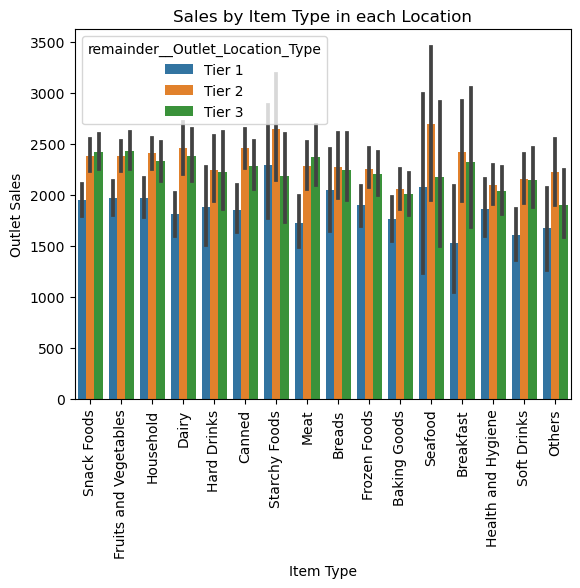

In [34]:
## Plotting the sales by item type in each location
sns.barplot(data=final_df,x='remainder__Item_Type',y='Item_Outlet_Sales',hue='remainder__Outlet_Location_Type')
plt.xticks(rotation=90)
plt.xlabel('Item Type')
plt.ylabel('Outlet Sales')
plt.title('Sales by Item Type in each Location')
plt.show()

#### Starchy foods is the item which is preferred in tier-1 cities.
#### Seafood is the item which is preferred in tier-2 cities.
#### Snack foods and fruits/vegetables are the items which are preferred in tier-3 cities.

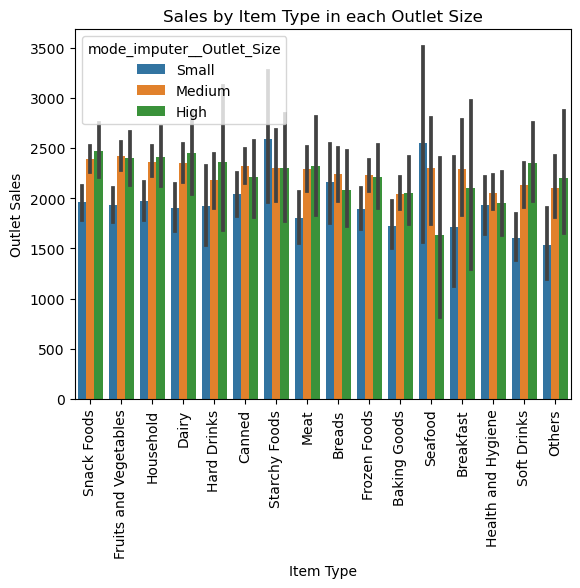

In [35]:
## plotting sales by item type in each outlet size
sns.barplot(data=final_df,x='remainder__Item_Type',y='Item_Outlet_Sales',hue='mode_imputer__Outlet_Size')
plt.xticks(rotation=90)
plt.xlabel('Item Type')
plt.ylabel('Outlet Sales')
plt.title('Sales by Item Type in each Outlet Size')
plt.show()

#### Snack foods is the item which is sold maximum in high sized outlets.
#### Fruits and vegetables are being sold maximum in medium sized outlets.
#### Starchy foods is being sold maximum in small sized outlets.

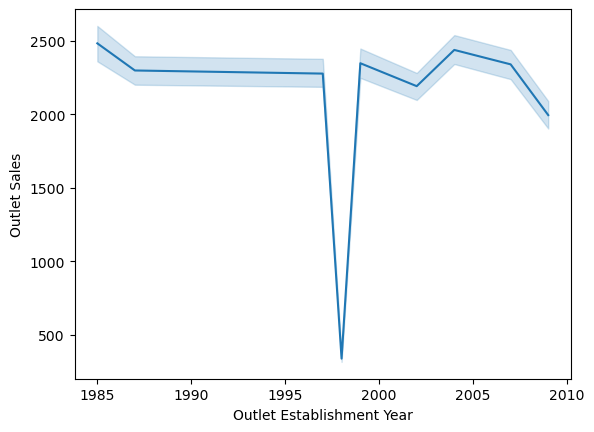

In [36]:
## plotting the lineplot to show the growth of the outlet over time
sns.lineplot(x='remainder__Outlet_Establishment_Year',y='Item_Outlet_Sales',data=final_df)
plt.xlabel('Outlet Establishment Year')
plt.ylabel('Outlet Sales')
plt.show()

#### We can see that the maximum drop in sales of the outlet was in the year 1998. The store took a massive jump in the year 2000(showing positive growth). Between 2000-2010 the sales of the outlet is between 2000- 2500 dollars. Between 1996-1995, the sales of the outlet is constant. From the line graph we can infer that, overall the growth trajectory of the outlet is not very strong as most of the time the sales are showing downward trends. 

In [37]:
## grouping the data of item type by MRP and getting the average mrp for each item. The results are sorted from highest mrp
## to lowest mrp
avg_price=final_df.groupby(['remainder__Item_Type'])['remainder__Item_MRP'].mean().sort_values(ascending=False)
avg_price

remainder__Item_Type
Household                149.424753
Dairy                    148.499208
Starchy Foods            147.838023
Snack Foods              146.194934
Fruits and Vegetables    144.581235
Seafood                  141.841719
Breakfast                141.788151
Breads                   140.952669
Meat                     139.882032
Canned                   139.763832
Frozen Foods             138.503366
Hard Drinks              137.077928
Others                   132.851430
Soft Drinks              131.492506
Health and Hygiene       130.818921
Baking Goods             126.380766
Name: remainder__Item_MRP, dtype: float64

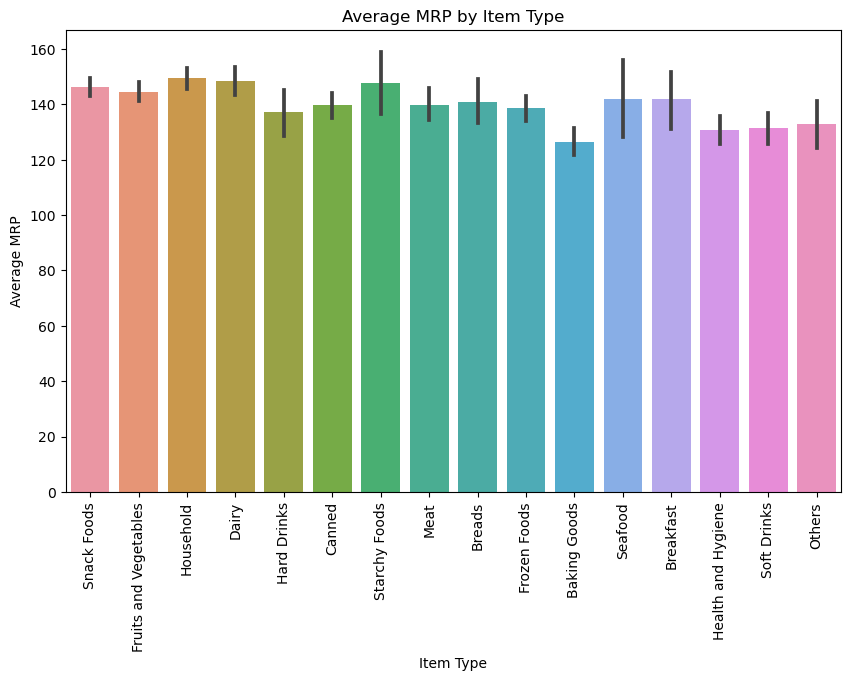

In [38]:
## Plotting the above results on the bar graph
plt.figure(figsize=(10,6))
sns.barplot(data=final_df,x='remainder__Item_Type',y='remainder__Item_MRP')
plt.title('Average MRP by Item Type')
plt.xlabel('Item Type')
plt.ylabel('Average MRP')
plt.xticks(rotation=90)
plt.show()

#### Household is the item which has the most expensive average MRP and Baking Goods has the cheapest average MRP.  On average, top 5 expensive items: Household, Dairy, Starchy foods, Snack foods and fruits/vegetables

<AxesSubplot:title={'center':'Total MRP by Item Type'}, xlabel='Total MRP', ylabel='Item Type'>

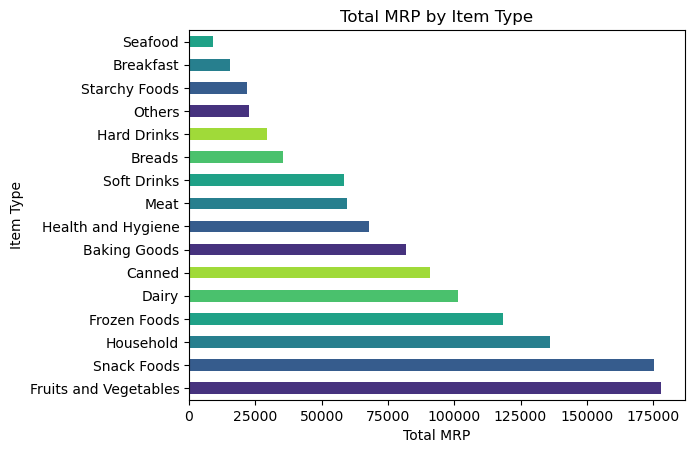

In [39]:
## grouping the data of item type by mrp and calculating the total mrp for each product. Plotting the results on a bar graph
sum_price=final_df.groupby(['remainder__Item_Type'])['remainder__Item_MRP'].sum().sort_values(ascending=False).plot(kind='barh',color=sns.color_palette('viridis'))
sum_price.set_xlabel('Total MRP')
sum_price.set_ylabel('Item Type')
sum_price.set_title('Total MRP by Item Type')
sum_price

#### This graph shows the total price of all the items. Fruits and vegetables has the highest total MRP and seafood has the cheapest total MRP

In [40]:
## plotting a scatter plots to show the relationship between different variables

fig=px.scatter(final_df,x='remainder__Item_MRP',y='Item_Outlet_Sales',title='Relationship between MRP and Sales',trendline='ols')
fig.show()

#### The relationship between MRP and sales is linear, which shows the total sales at an outlet depends upon the maximum retail price at which that particular outlet is selling its products

In [41]:
fig=px.scatter(final_df,x='mean_imputer__Item_Weight',y='Item_Outlet_Sales',trendline='ols',
              title='Relationship between Weight and Sales')
fig.show()

#### The relationship between item weight and total sales is positive. As weight of an item increases, sales also increases. According to the trendline, if you increase the weight of an item by 1kg then the total sales increases by $4.87 dollars.

In [42]:
fig=px.scatter(final_df,x='remainder__Item_Visibility',y='Item_Outlet_Sales',trendline='ols',
              title='Relationship between Visibility and Sales')
fig.show()

#### There is a negative relationship between item visibility and total sales. That means if you increase the item visibility i.e. if the product is far from the eyes of the customer, it won't  be able to catch the attention and therefore will not sell. Hence those products which are near the entrance will catch attention first and sell more.

In [43]:
## Plotting boxplots for different variables to check outliers and their distribution
fig=px.box(final_df,y='Item_Outlet_Sales',title='Boxplot of Outlet Sales')
fig.show()

In [44]:
fig=px.box(final_df,y='remainder__Item_Visibility',title='Boxplot of Item visibility')
fig.show()

In [45]:
fig=px.box(final_df,y='mean_imputer__Item_Weight',title='Boxplot of item weight')
fig.show()

In [46]:
fig=px.box(final_df,y='remainder__Item_MRP',title='Boxplot of Item MRP')
fig.show()

In [47]:
fig=px.box(final_df,x='mode_imputer__Outlet_Size',y='Item_Outlet_Sales',title='Boxplot of sales by outlet size')
fig.show()

In [48]:
fig=px.box(final_df,x='remainder__Outlet_Location_Type',y='Item_Outlet_Sales',title='Boxplot of sales by location')
fig.show()

In [49]:
fig=px.box(final_df,x='remainder__Outlet_Type',y='Item_Outlet_Sales',title='Boxplot of sales by outlet type')
fig.show()

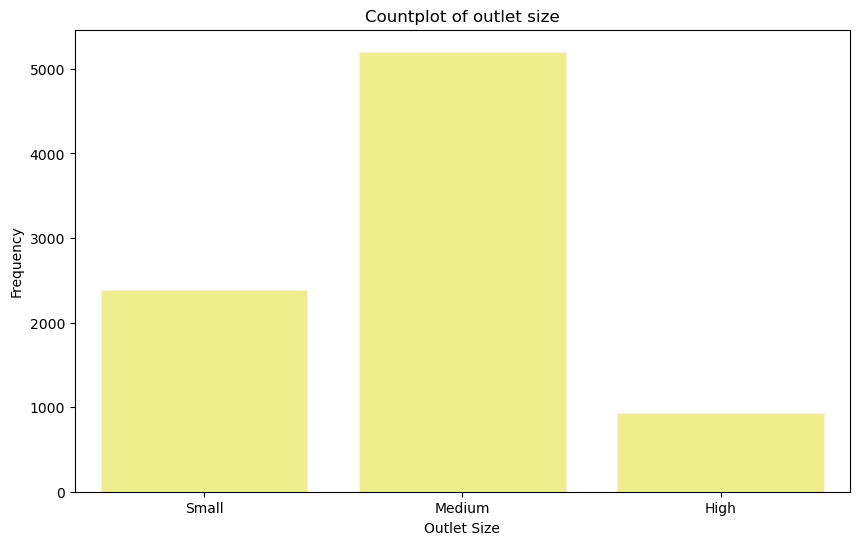

In [50]:
## Plotting countplots for all the categorical variables to know the frequency of each category

plt.figure(figsize=(10,6))
sns.countplot(data=final_df,x='mode_imputer__Outlet_Size',color='yellow',edgecolor='linen',alpha=0.5)
plt.title('Countplot of outlet size')
plt.ylabel('Frequency')
plt.xlabel('Outlet Size')
plt.show()

In [51]:
cat_vars=['remainder__Outlet_Location_Type','remainder__Outlet_Type','remainder__Item_Fat_Content']

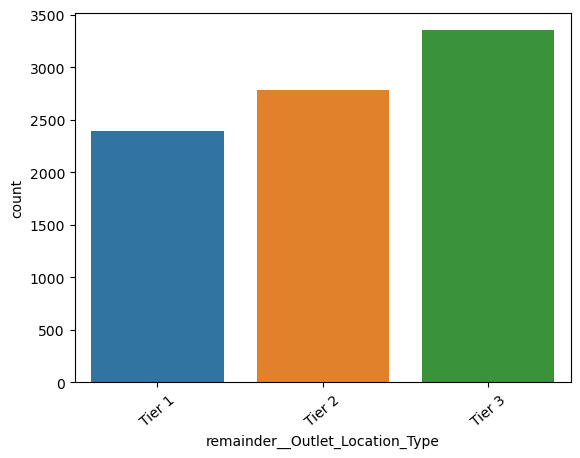

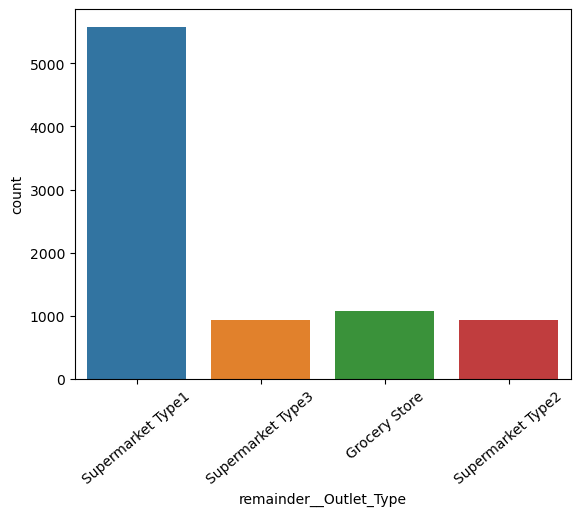

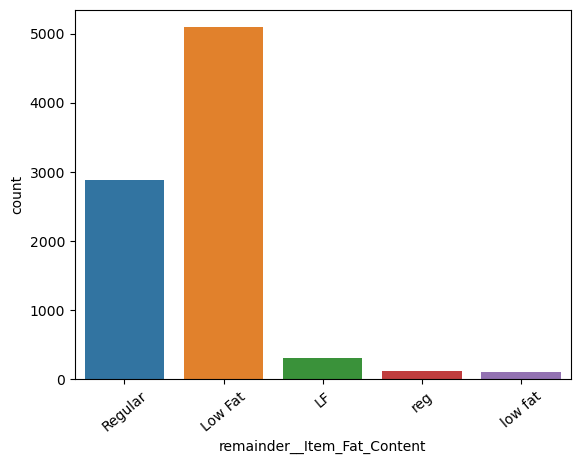

In [52]:
## Loop of above listed categories and getting their countplots
for var in cat_vars:
    sns.countplot(data=final_df,x=var)
    plt.xticks(rotation=40)
    plt.show()

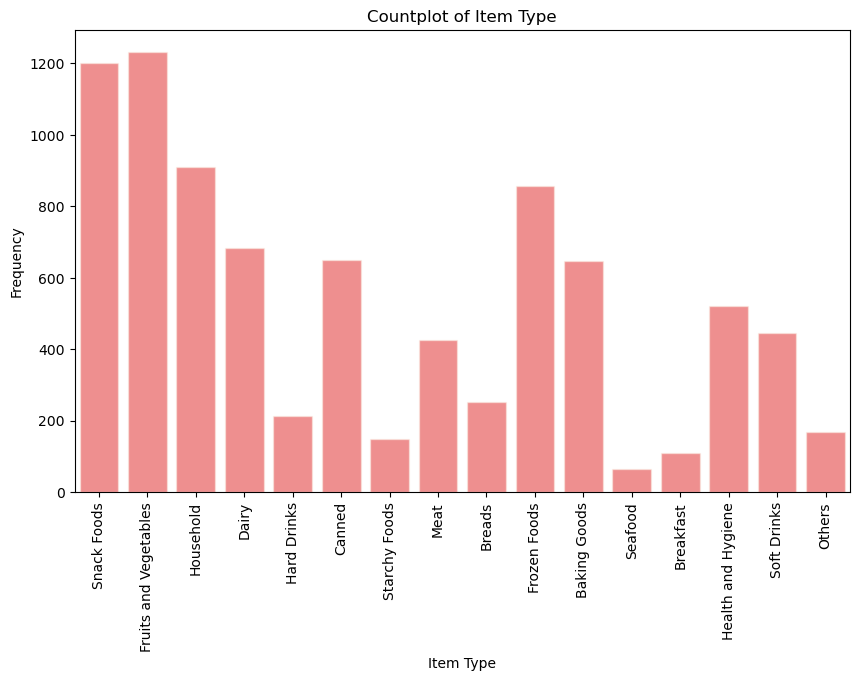

In [53]:
plt.figure(figsize=(10,6))
sns.countplot(data=final_df,x='remainder__Item_Type',color='red',edgecolor='linen',alpha=0.5)
plt.title('Countplot of Item Type')
plt.ylabel('Frequency')
plt.xlabel('Item Type')
plt.xticks(rotation=90)
plt.show()

In [54]:
final_df['remainder__Item_Fat_Content'].value_counts() ## Number of records present in each category

Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: remainder__Item_Fat_Content, dtype: int64

In [55]:
## Merging lf,reg,low fat into a single category
final_df['remainder__Item_Fat_Content']=final_df['remainder__Item_Fat_Content'].replace(['LF','low fat','reg'],'other')

In [56]:
## Final result after merging
final_df['remainder__Item_Fat_Content'].value_counts() 

Low Fat    5089
Regular    2889
other       545
Name: remainder__Item_Fat_Content, dtype: int64

In [57]:
## Pie chart showing sales by fat content
color=['blue','red','green']
fig=go.Figure(go.Pie(labels=final_df['remainder__Item_Fat_Content'],values=final_df['Item_Outlet_Sales'],
                    title='Sales by fat content'))
fig.show()

#### Items having low fat are highly sold in the market. This means that most customers want healthy products as they are more health conscious.

<AxesSubplot:>

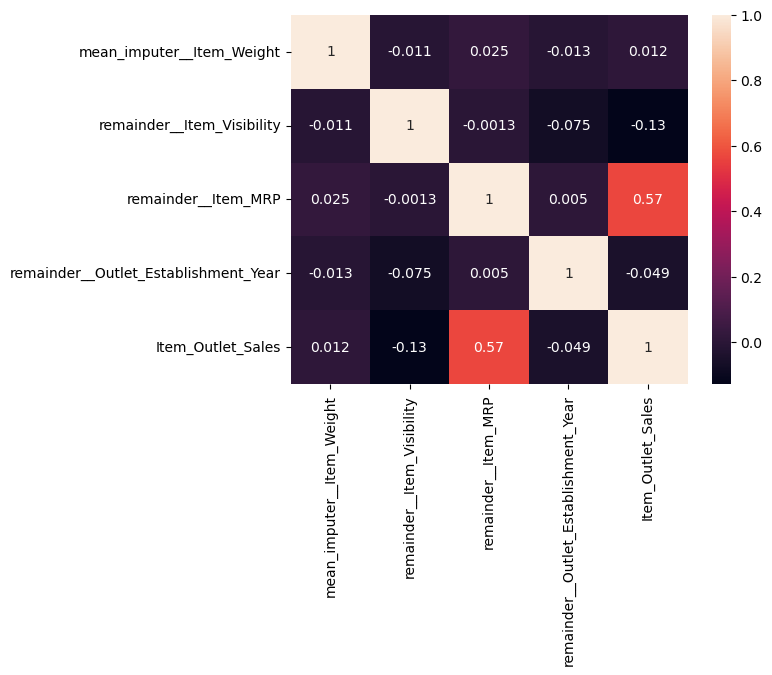

In [58]:
## Determining the correlation between all the variables
data=final_df.corr()
sns.heatmap(data,annot=True)

### Feature Engineering

In [59]:
final_df.head()

,mean_imputer__Item_Weight,mode_imputer__Outlet_Size,remainder__Item_Identifier,remainder__Item_Fat_Content,remainder__Item_Visibility,remainder__Item_Type,remainder__Item_MRP,remainder__Outlet_Identifier,remainder__Outlet_Establishment_Year,remainder__Outlet_Location_Type,remainder__Outlet_Type,Item_Outlet_Sales
88,6.305000,Small,FDN33,Regular,0.123116,Snack Foods,95.6436,OUT046,1997,Tier 1,Supermarket Type1,661.8052
6813,5.980000,Medium,FDY31,Low Fat,0.043809,Fruits and Vegetables,146.8418,OUT017,2007,Tier 2,Supermarket Type1,1765.7016
4046,12.929873,Medium,NCH54,Low Fat,0.072317,Household,160.7920,OUT027,1985,Tier 3,Supermarket Type3,3675.2160
8194,12.929873,Small,FDY15,Regular,0.299098,Dairy,157.8630,OUT019,1985,Tier 1,Grocery Store,469.3890
8293,9.100000,Small,NCT30,Low Fat,0.080278,Household,47.2718,OUT035,2004,Tier 2,Supermarket Type1,850.8924


In [60]:
## Dropping the columns which are not important for prediction
final_df.drop(['remainder__Item_Identifier','remainder__Outlet_Identifier','remainder__Outlet_Establishment_Year'],axis=1,
             inplace=True)

final_df.head()

,mean_imputer__Item_Weight,mode_imputer__Outlet_Size,remainder__Item_Fat_Content,remainder__Item_Visibility,remainder__Item_Type,remainder__Item_MRP,remainder__Outlet_Location_Type,remainder__Outlet_Type,Item_Outlet_Sales
88,6.305000,Small,Regular,0.123116,Snack Foods,95.6436,Tier 1,Supermarket Type1,661.8052
6813,5.980000,Medium,Low Fat,0.043809,Fruits and Vegetables,146.8418,Tier 2,Supermarket Type1,1765.7016
4046,12.929873,Medium,Low Fat,0.072317,Household,160.7920,Tier 3,Supermarket Type3,3675.2160
8194,12.929873,Small,Regular,0.299098,Dairy,157.8630,Tier 1,Grocery Store,469.3890
8293,9.100000,Small,Low Fat,0.080278,Household,47.2718,Tier 2,Supermarket Type1,850.8924


In [61]:
final_df['mode_imputer__Outlet_Size'].unique() ## Number of categories present in the variable

array(['Small', 'Medium', 'High'], dtype=object)

In [62]:
for col in final_df.columns:
    print(col,': ',len(final_df[col].unique()),'labels') ## loop to get the number of labels in each category.

mean_imputer__Item_Weight :  416 labels
mode_imputer__Outlet_Size :  3 labels
remainder__Item_Fat_Content :  3 labels
remainder__Item_Visibility :  7880 labels
remainder__Item_Type :  16 labels
remainder__Item_MRP :  5938 labels
remainder__Outlet_Location_Type :  3 labels
remainder__Outlet_Type :  4 labels
Item_Outlet_Sales :  3493 labels


In [63]:
## Assigning labels to each category of the variable outlet size. Here enumerate is used for iteration
## the result is stored in a dictionary and the labels start from 0
ordinal_mapping={
    k:i
    for i,k in enumerate(final_df['mode_imputer__Outlet_Size'].unique(),0)
}

ordinal_mapping

{'Small': 0, 'Medium': 1, 'High': 2}

In [64]:
## Replacing the labels in the variable outlet size by mapping 
final_df['mode_imputer__Outlet_Size']=final_df['mode_imputer__Outlet_Size'].map(ordinal_mapping)

In [65]:
final_df.head()

,mean_imputer__Item_Weight,mode_imputer__Outlet_Size,remainder__Item_Fat_Content,remainder__Item_Visibility,remainder__Item_Type,remainder__Item_MRP,remainder__Outlet_Location_Type,remainder__Outlet_Type,Item_Outlet_Sales
88,6.305000,0,Regular,0.123116,Snack Foods,95.6436,Tier 1,Supermarket Type1,661.8052
6813,5.980000,1,Low Fat,0.043809,Fruits and Vegetables,146.8418,Tier 2,Supermarket Type1,1765.7016
4046,12.929873,1,Low Fat,0.072317,Household,160.7920,Tier 3,Supermarket Type3,3675.2160
8194,12.929873,0,Regular,0.299098,Dairy,157.8630,Tier 1,Grocery Store,469.3890
8293,9.100000,0,Low Fat,0.080278,Household,47.2718,Tier 2,Supermarket Type1,850.8924


In [66]:
## The above code can be represented by 2 functions

def find_category_mappings(final_df,variable):
    return {k:i for i,k in enumerate(final_df[variable].unique(),0)} ## assigning labels

def integer_encode(final_df,variable,ordinal_mapping):
    final_df[variable]=final_df[variable].map(ordinal_mapping) ## encoding the labels

In [67]:
## loop to encode the categories for the below mentioned list
for variable in ['remainder__Item_Fat_Content','remainder__Item_Type','remainder__Outlet_Location_Type',
                 'remainder__Outlet_Type']:
    
    mappings=find_category_mappings(final_df,variable)
    integer_encode(final_df,variable,mappings)

In [68]:
final_df.head()

,mean_imputer__Item_Weight,mode_imputer__Outlet_Size,remainder__Item_Fat_Content,remainder__Item_Visibility,remainder__Item_Type,remainder__Item_MRP,remainder__Outlet_Location_Type,remainder__Outlet_Type,Item_Outlet_Sales
88,6.305000,0,0,0.123116,0,95.6436,0,0,661.8052
6813,5.980000,1,1,0.043809,1,146.8418,1,0,1765.7016
4046,12.929873,1,1,0.072317,2,160.7920,2,1,3675.2160
8194,12.929873,0,0,0.299098,3,157.8630,0,2,469.3890
8293,9.100000,0,1,0.080278,2,47.2718,1,0,850.8924


### Handling Outliers

Text(0, 0.5, 'Sales')

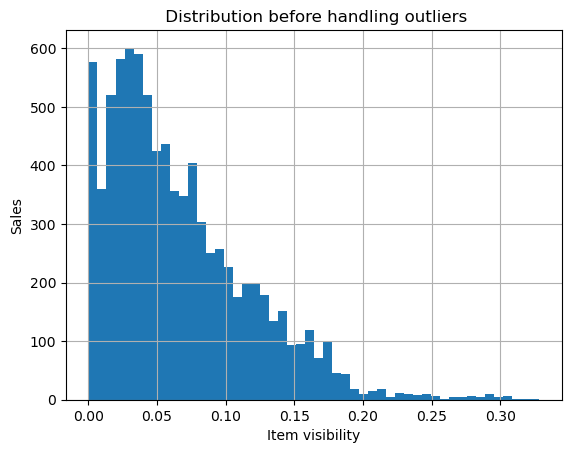

In [69]:
## Item_Visibility

fig=final_df.remainder__Item_Visibility.hist(bins=50)
fig.set_title(' Distribution before handling outliers')
fig.set_xlabel('Item visibility')
fig.set_ylabel('Sales')

In [70]:
## Calculating IQR to cap outiers
IQR=final_df['remainder__Item_Visibility'].quantile(0.75)-final_df['remainder__Item_Visibility'].quantile(0.25)
IQR

0.067595815

In [71]:
## Getting the lower bound and upper bound
lower_bound=final_df['remainder__Item_Visibility'].quantile(0.25)-(IQR*3)
upper_bound=final_df['remainder__Item_Visibility'].quantile(0.75)+(IQR*3)
print(lower_bound),print(upper_bound)

-0.1757979675
0.29737273750000004


(None, None)

In [72]:
df=final_df.copy() ## making a copy after handling outliers

In [73]:
## Replacing the outliers of item visibility with 0.3 which is the upper bound
## values which are more than 0.3 are replaced by 0.3
df.loc[df['remainder__Item_Visibility']>0.3,'remainder__Item_Visibility']=0.3

Text(0, 0.5, 'Sales')

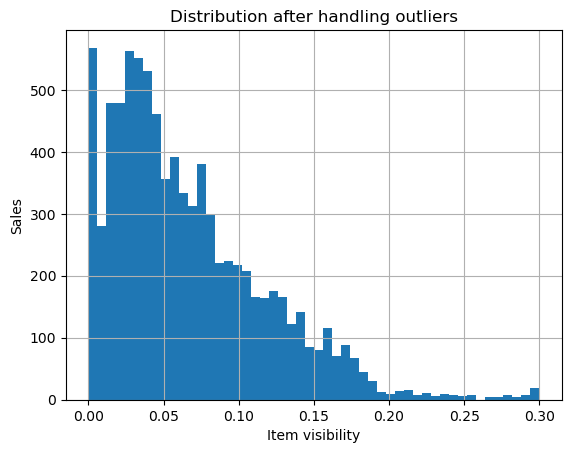

In [74]:
fig=df.remainder__Item_Visibility.hist(bins=50)
fig.set_title('Distribution after handling outliers')
fig.set_xlabel('Item visibility')
fig.set_ylabel('Sales')

Text(0.5, 0, 'Sales')

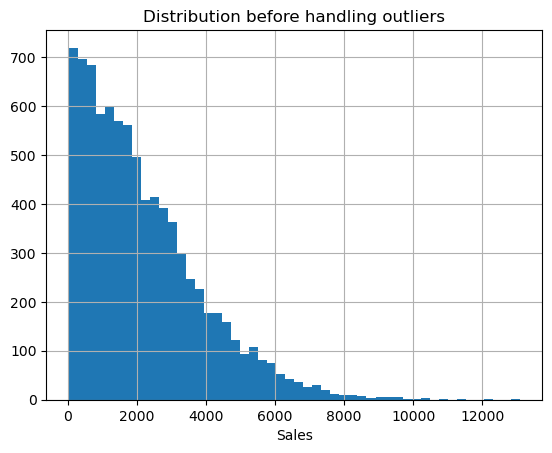

In [75]:
## Item_Outlet_Sales

fig=final_df['Item_Outlet_Sales'].hist(bins=50)
fig.set_title('Distribution before handling outliers')
fig.set_xlabel('Sales')

In [76]:
IQR=final_df['Item_Outlet_Sales'].quantile(0.75)-final_df['Item_Outlet_Sales'].quantile(0.25)
IQR

2267.049

In [77]:
lower_bound=final_df['Item_Outlet_Sales'].quantile(0.25)-(IQR*3)
upper_bound=final_df['Item_Outlet_Sales'].quantile(0.75)+(IQR*3)
print(lower_bound),print(upper_bound)

-5966.8996
9902.4434


(None, None)

In [78]:
df.loc[df['Item_Outlet_Sales']>9902,'Item_Outlet_Sales']=9902

Text(0.5, 0, 'Sales')

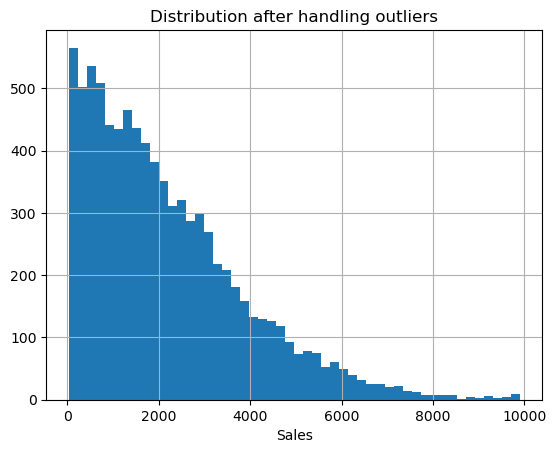

In [79]:
fig=df['Item_Outlet_Sales'].hist(bins=50)
fig.set_title('Distribution after handling outliers')
fig.set_xlabel('Sales')

In [80]:
out_var=['Item_Outlet_Sales','remainder__Item_Visibility']

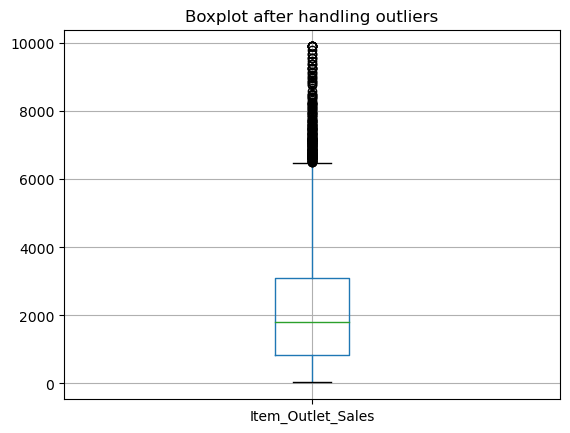

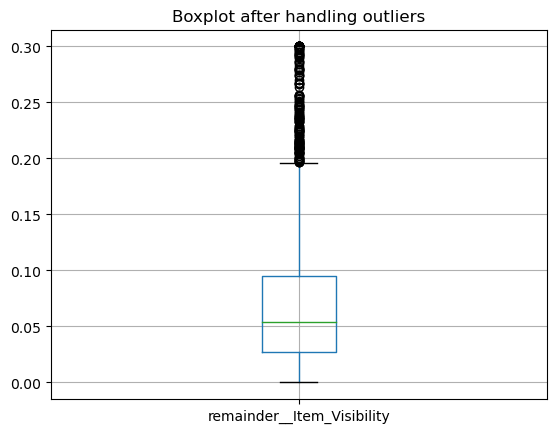

In [81]:
for var in out_var:
    df.boxplot(column=var)
    plt.title('Boxplot after handling outliers')
    plt.show()

### Variable transformation

In [82]:
import scipy.stats as stats

In [83]:
def diagnostic_plots(df,variable): ## function to plot histogram and Q-Q plot of the variables to check normality
    
    plt.figure(figsize=(15,6)) ## giving size of figure
    
    plt.subplot(1,2,1)
    df[variable].hist(bins=50) ## histogram for the variable
    plt.title(f'Histogram of {variable}') 
    
    plt.subplot(1,2,2)
    stats.probplot(df[variable],dist='norm',plot=plt) ## Q-Q plot for the variable
    plt.title(f'Q-Q plot of {variable}')
    
    plt.show()

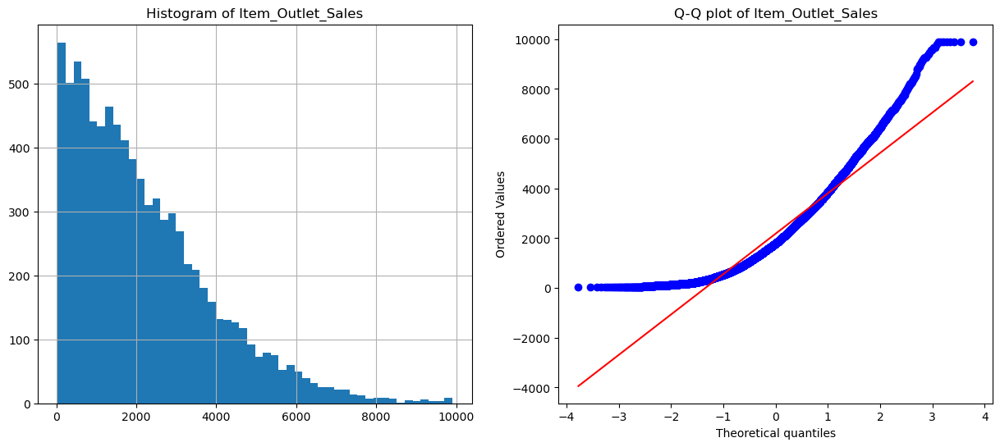

In [84]:
diagnostic_plots(df,'Item_Outlet_Sales')

#### We can see that item outlet sales is rightly skewed

In [85]:
df['Item_Outlet_Sales'],param=stats.boxcox(df['Item_Outlet_Sales']) ## applying boxcox transformation to turn into normal dist

In [86]:
print('Optimal lambda:',param)

Optimal lambda: 0.34802353961014315


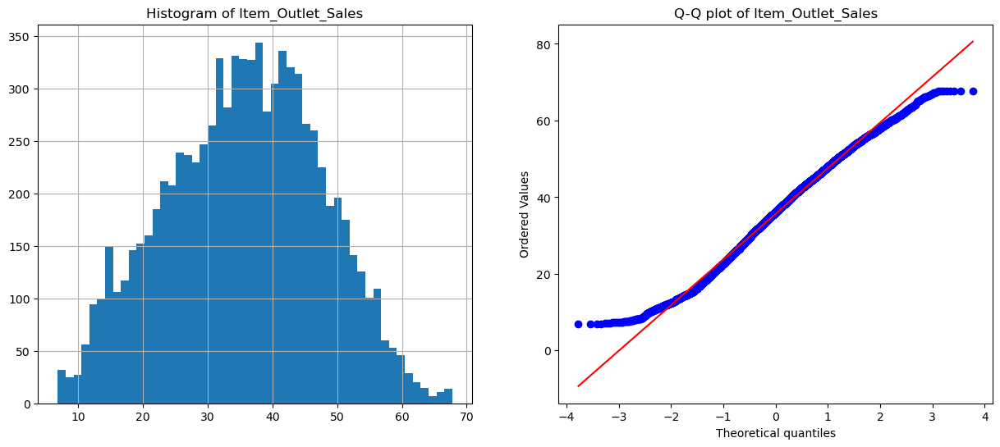

In [87]:
diagnostic_plots(df,'Item_Outlet_Sales')

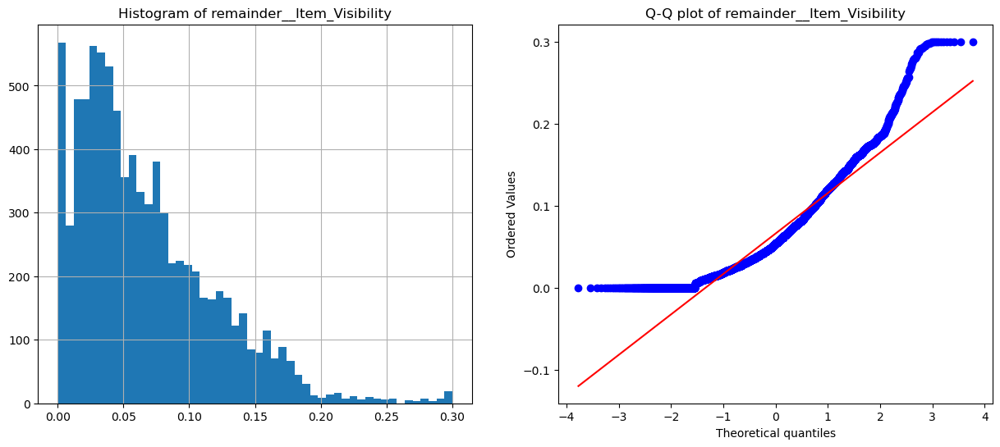

In [88]:
diagnostic_plots(df,'remainder__Item_Visibility')

In [89]:
df['remainder__Item_Visibility'],param=stats.yeojohnson(df['remainder__Item_Visibility'])

In [90]:
print('Optimal lambda:',param)

Optimal lambda: -8.694151028666763


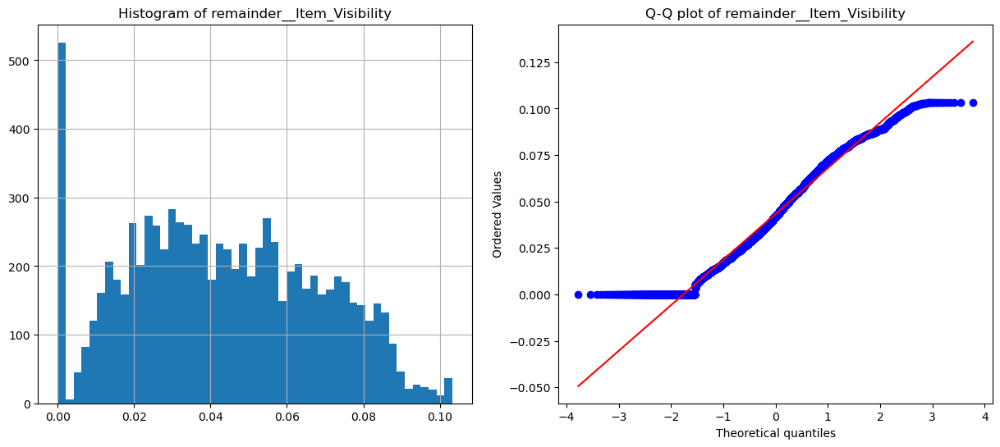

In [91]:
diagnostic_plots(df,'remainder__Item_Visibility')

In [92]:
vars=['remainder__Item_Visibility','Item_Outlet_Sales']

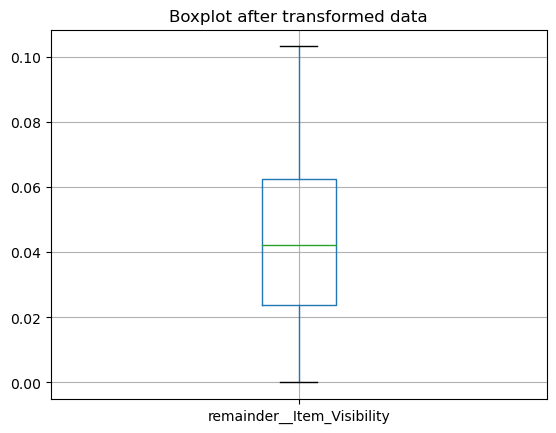

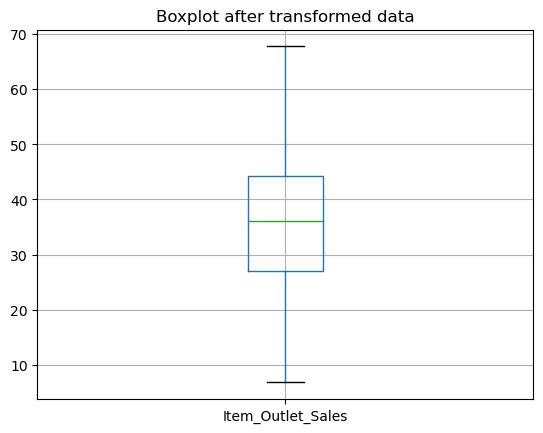

In [93]:
for var in vars:
    df.boxplot(column=var)
    plt.title('Boxplot after transformed data')
    plt.show()

### Test data

### We will apply all the data preprocessing steps again for the test data

In [94]:
df_test=pd.read_csv('C:\\Python\\Test.csv')
df_test.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDW58,20.750,Low Fat,0.007565,Snack Foods,107.8622,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,FDW14,8.300,reg,0.038428,Dairy,87.3198,OUT017,2007,NaN,Tier 2,Supermarket Type1
2,NCN55,14.600,Low Fat,0.099575,Others,241.7538,OUT010,1998,NaN,Tier 3,Grocery Store
3,FDQ58,7.315,Low Fat,0.015388,Snack Foods,155.0340,OUT017,2007,NaN,Tier 2,Supermarket Type1
4,FDY38,NaN,Regular,0.118599,Dairy,234.2300,OUT027,1985,Medium,Tier 3,Supermarket Type3


In [95]:
vars_na=[var for var in df_test.columns if df_test[var].isnull().sum()>0] ## Getting the columns having missing data
vars_na

['Item_Weight', 'Outlet_Size']

In [96]:
df_test.isnull().sum()

Item_Identifier                 0
Item_Weight                   976
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  1606
Outlet_Location_Type            0
Outlet_Type                     0
dtype: int64

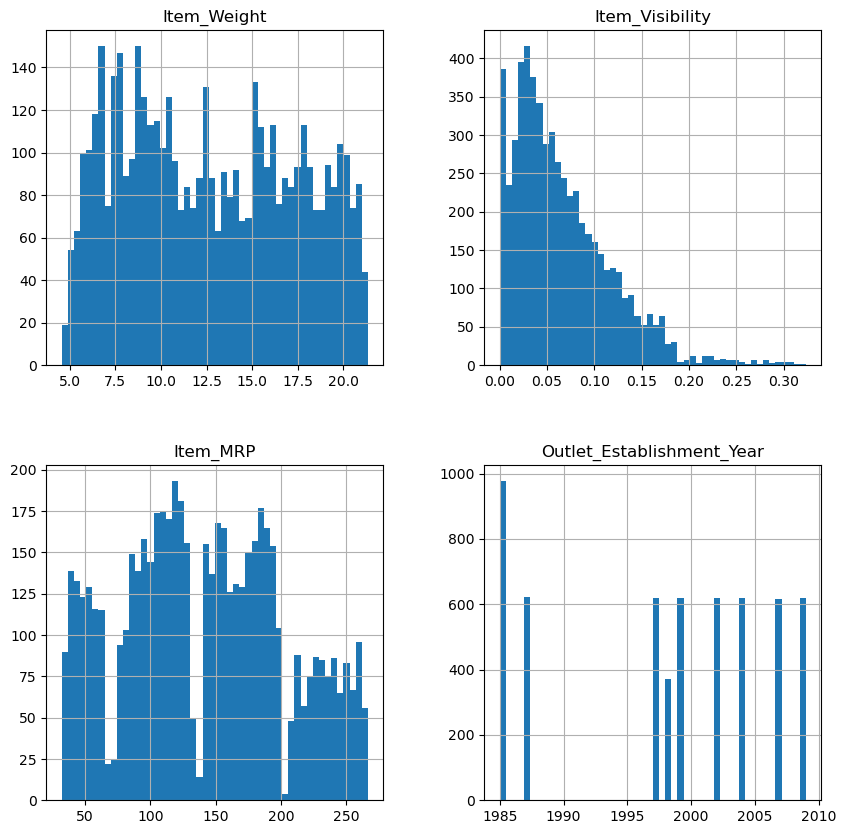

In [97]:
df_test.hist(bins=50,figsize=(10,10)) ## Plotting histograms of the data before imputing nan values
plt.show()

In [98]:
def impute_nan(df_test,variable):
    mean=df_test[variable].mean()
    df_test[variable]=df_test[variable].fillna(mean)

In [99]:
impute_nan(df_test,'Item_Weight')

In [100]:
def impute_nan(df_test,variable):
    mode=df_test[variable].mode()
    df_test[variable]=df_test[variable].fillna(mode)[0]

In [101]:
impute_nan(df_test,'Outlet_Size')

In [102]:
df_test.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
dtype: int64

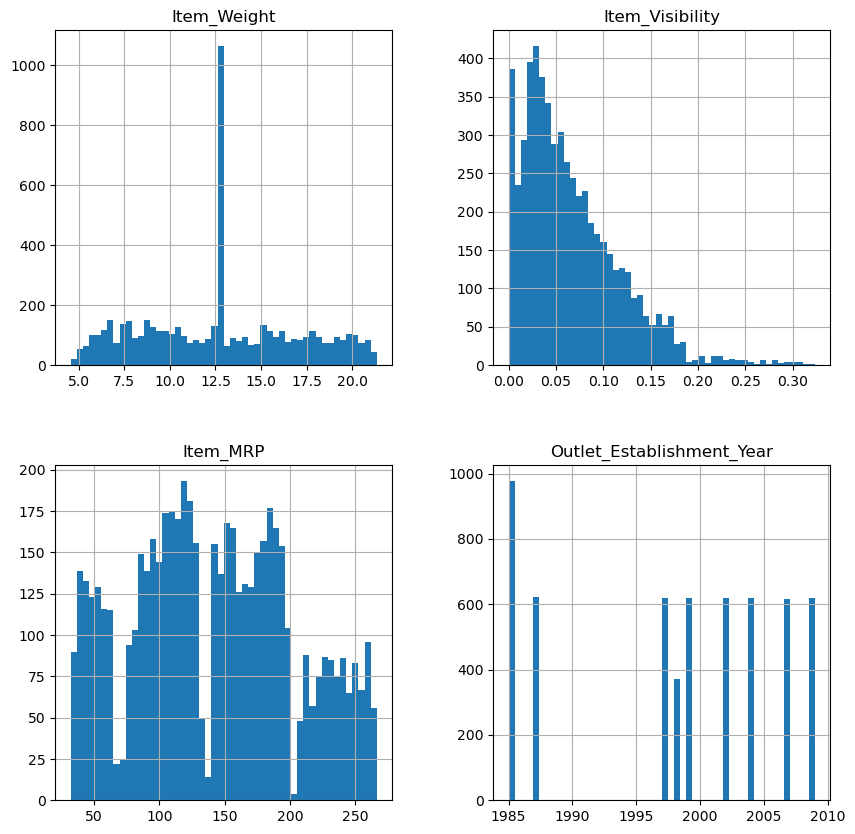

In [103]:
df_test.hist(bins=50,figsize=(10,10))
plt.show()

In [104]:
df_test.drop(['Item_Identifier','Outlet_Identifier','Outlet_Establishment_Year'],axis=1,
             inplace=True)

df_test.head()

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,20.750000,Low Fat,0.007565,Snack Foods,107.8622,Medium,Tier 1,Supermarket Type1
1,8.300000,reg,0.038428,Dairy,87.3198,Medium,Tier 2,Supermarket Type1
2,14.600000,Low Fat,0.099575,Others,241.7538,Medium,Tier 3,Grocery Store
3,7.315000,Low Fat,0.015388,Snack Foods,155.0340,Medium,Tier 2,Supermarket Type1
4,12.695633,Regular,0.118599,Dairy,234.2300,Medium,Tier 3,Supermarket Type3


In [105]:
df_test['Item_Fat_Content'].unique()

array(['Low Fat', 'reg', 'Regular', 'LF', 'low fat'], dtype=object)

In [106]:
df_test['Item_Fat_Content']=df_test['Item_Fat_Content'].replace(['reg','LF','low fat'],'other')

In [107]:
df_test['Item_Fat_Content'].unique()

array(['Low Fat', 'other', 'Regular'], dtype=object)

In [108]:
for col in df_test.columns:
    print(col,': ',len(df_test[col].unique()),'labels') ## loop to get the number of labels in each category

Item_Weight :  411 labels
Item_Fat_Content :  3 labels
Item_Visibility :  5277 labels
Item_Type :  16 labels
Item_MRP :  4402 labels
Outlet_Size :  1 labels
Outlet_Location_Type :  3 labels
Outlet_Type :  4 labels


In [109]:
ordinal_mapping={
    k:i
    for i,k in enumerate(df_test['Item_Fat_Content'].unique(),0)
}
ordinal_mapping

{'Low Fat': 0, 'other': 1, 'Regular': 2}

In [110]:
df_test['Item_Fat_Content']=df_test['Item_Fat_Content'].map(ordinal_mapping)

In [111]:
def categorical_mappings(df_test,variable):
    return {k:i for i,k in enumerate(df_test[variable].unique(),0)}

def integer_encode(df_test,variable,ordinal_mapping):
    df_test[variable]=df_test[variable].map(ordinal_mapping)

In [112]:
for variable in ['Item_Type','Outlet_Size','Outlet_Location_Type','Outlet_Type']:
    mapping=categorical_mappings(df_test,variable)
    integer_encode(df_test,variable,mapping)

In [113]:
df_test.head()

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,20.750000,0,0.007565,0,107.8622,0,0,0
1,8.300000,1,0.038428,1,87.3198,0,1,0
2,14.600000,0,0.099575,2,241.7538,0,2,1
3,7.315000,0,0.015388,0,155.0340,0,1,0
4,12.695633,2,0.118599,1,234.2300,0,2,2


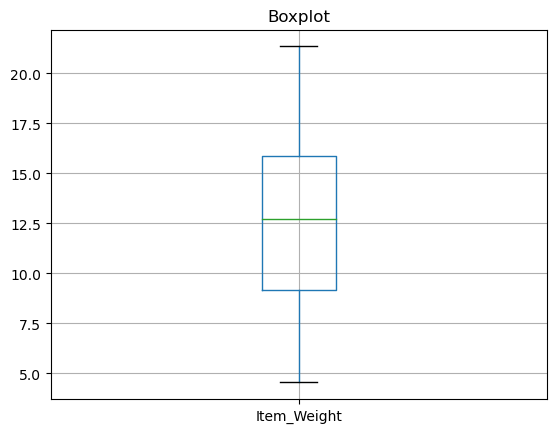

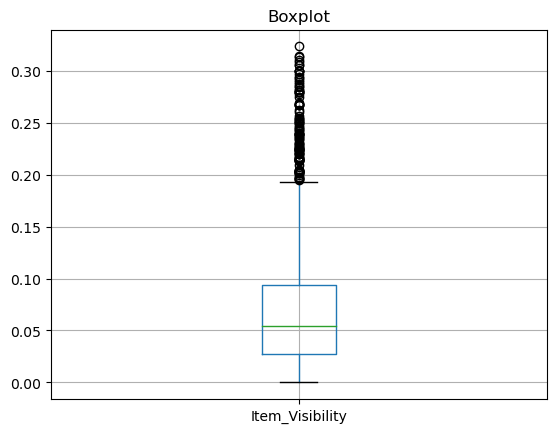

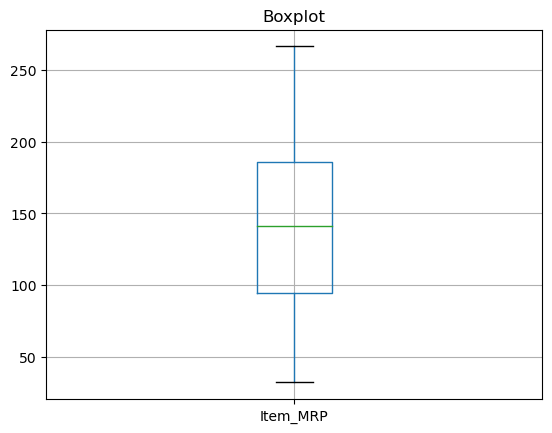

In [114]:
var=['Item_Weight','Item_Visibility','Item_MRP']
for var in var:
    df_test.boxplot(column=var)
    plt.title('Boxplot')
    plt.show()

Text(0, 0.5, 'Sales')

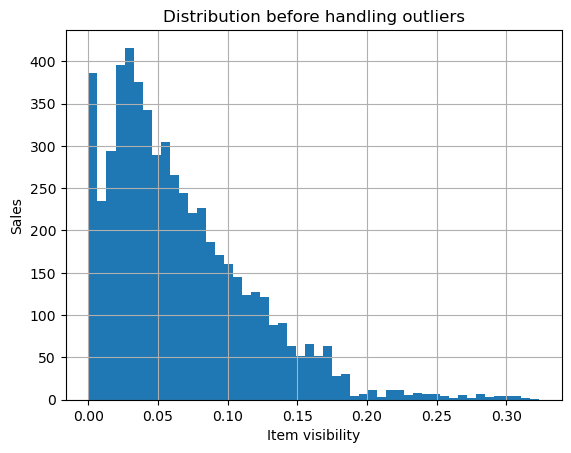

In [115]:
fig=df_test.Item_Visibility.hist(bins=50)
fig.set_title('Distribution before handling outliers')
fig.set_xlabel('Item visibility')
fig.set_ylabel('Sales')

In [116]:
## Calculating IQR to cap outiers
IQR=df_test['Item_Visibility'].quantile(0.75)-df_test['Item_Visibility'].quantile(0.25)
IQR

0.066415748

In [117]:
## Getting the lower bound and upper bound
lower_bound=df_test['Item_Visibility'].quantile(0.25)-(IQR*3)
upper_bound=df_test['Item_Visibility'].quantile(0.75)+(IQR*3)
print(lower_bound),print(upper_bound)

-0.172200369
0.292709867


(None, None)

In [118]:
data=df_test.copy()

In [119]:
data.loc[data['Item_Visibility']>0.3,'Item_Visibility']=0.3

Text(0, 0.5, 'Sales')

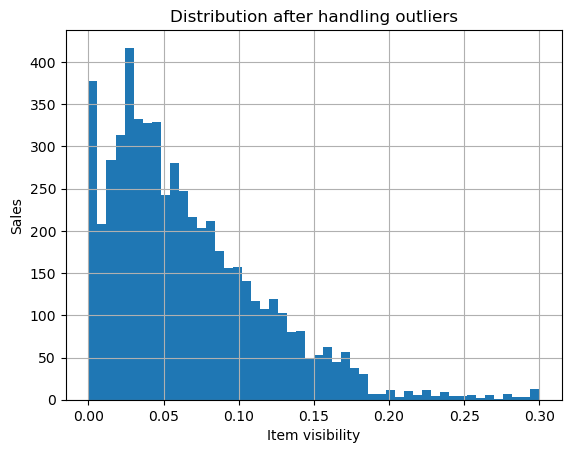

In [120]:
fig=data.Item_Visibility.hist(bins=50)
fig.set_title('Distribution after handling outliers')
fig.set_xlabel('Item visibility')
fig.set_ylabel('Sales')

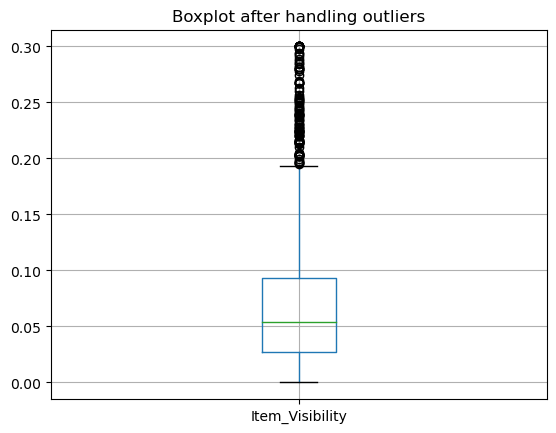

In [121]:
data.boxplot(column='Item_Visibility')
plt.title('Boxplot after handling outliers')
plt.show()

In [122]:
def diagnostic_plots(data,variable):
    
    plt.figure(figsize=(10,6))
    
    plt.subplot(1,2,1)
    data[variable].hist(bins=50)
    plt.title(f'Histogram of {variable}') 
    
    plt.subplot(1,2,2)
    stats.probplot(data[variable],dist='norm',plot=plt) ## Q-Q plot for the variable
    plt.title(f'Q-Q plot of {variable}')
    
    plt.show()

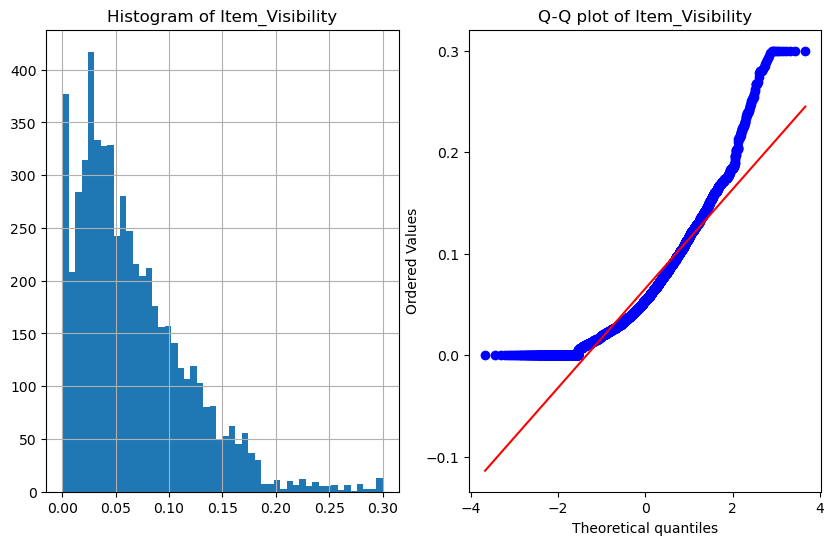

In [123]:
diagnostic_plots(data,'Item_Visibility')

In [124]:
data['Item_Visibility'],param=stats.yeojohnson(data['Item_Visibility'])

In [125]:
print('Optimal lambda:',param)

Optimal lambda: -8.788703236349207


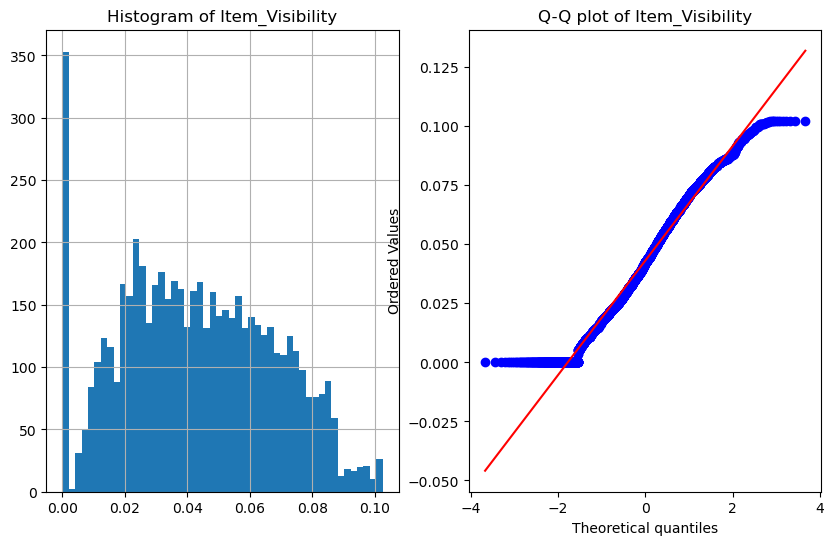

In [126]:
diagnostic_plots(data,'Item_Visibility')

<AxesSubplot:>

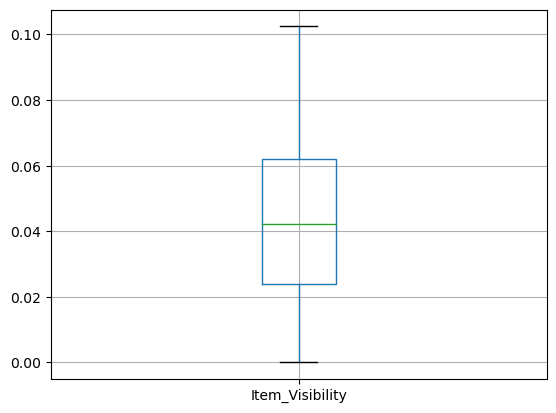

In [127]:
data.boxplot(column='Item_Visibility')

### Model building

### Random Forest Regressor

In [128]:
## Importing the necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

In [129]:
X=df.drop('Item_Outlet_Sales',axis=1) ## independent features
y=df['Item_Outlet_Sales'] ## dependent features

In [130]:
X_train,X_test,y_train,y_test=train_test_split(

    df.drop('Item_Outlet_Sales',axis=1),
    df['Item_Outlet_Sales'],
    test_size=0.3,
    random_state=0
)

In [131]:
X_train.shape,X_test.shape

((5966, 8), (2557, 8))

In [132]:
reg=RandomForestRegressor() ## Initializing our random forest model

In [133]:
reg.fit(X_train,y_train) ## fitting our model on train set

RandomForestRegressor()

In [134]:
y_pred=reg.predict(X_test) ## making predictions on test data

### Model Evaluation before hyperparameter tuning

In [135]:
print('R2 Score:',r2_score(y_test,y_pred))

R2 Score: 0.6634037367064871


In [136]:
print('Mean absolute error:',mean_absolute_error(y_test,y_pred))

Mean absolute error: 5.4242023106707125


In [137]:
print('Mean squared error:',mean_squared_error(y_test,y_pred))

Mean squared error: 48.355581573001885


In [138]:
print('Mean absolute percentage error:',mean_absolute_percentage_error(y_test,y_pred))

Mean absolute percentage error: 0.17166127581189325


In [139]:
pd.DataFrame(reg.feature_importances_,X_train.columns).sort_values(by=0,ascending=False) ## feature importance

,0
remainder__Item_MRP,0.419002
remainder__Outlet_Type,0.372017
remainder__Item_Visibility,0.084833
mean_imputer__Item_Weight,0.052962
remainder__Item_Type,0.035307
mode_imputer__Outlet_Size,0.012205
remainder__Item_Fat_Content,0.012189
remainder__Outlet_Location_Type,0.011486


#### We can see that Item_MRP, Outlet_Type and Item_visibility are  the top 3 features which the model believes can have a crucial impact on when making predictions

### Hyperparameter Tuning

In [140]:
reg=RandomForestRegressor(max_samples=0.1,random_state=42) ## setting max_samples and random state
reg.fit(X_train,y_train)
y_pred=reg.predict(X_test)
r2_score(y_test,y_pred)

0.7022388001378448

In [141]:
from sklearn.model_selection import cross_val_score
np.mean(cross_val_score(RandomForestRegressor(max_samples=0.1),X,y,scoring='r2')) ## Cross validation reduces accuracy
##  hence we will not use cross validation

0.6905760730430813

In [142]:
## Tuning different parameters and giving them values
n_estimators=[20,60,50,120]
max_features=[0.2,0.6,1.0]
max_depth=[2,8,None]
max_samples=[0.5,0.1,0.75,0.8]
bootstrap=[True,False]
min_samples_split=[2,5]
min_samples_leaf=[1,2]

In [143]:
param_grid={'n_estimators':n_estimators,
          'max_features':max_features,
          'max_depth':max_depth,
          'max_samples':max_samples,
            'bootstrap':bootstrap,
           'min_samples_split':min_samples_split,
           'min_samples_leaf':min_samples_leaf} ## Making a grid of all the parameters
print(param_grid)

{'n_estimators': [20, 60, 50, 120], 'max_features': [0.2, 0.6, 1.0], 'max_depth': [2, 8, None], 'max_samples': [0.5, 0.1, 0.75, 0.8], 'bootstrap': [True, False], 'min_samples_split': [2, 5], 'min_samples_leaf': [1, 2]}


In [144]:
reg=RandomForestRegressor()

In [145]:
reg_grid=GridSearchCV(estimator=reg,
                     param_grid=param_grid,
                     cv=5,verbose=2,n_jobs=-1) ## using grid search cv for tuning

In [146]:
reg_grid.fit(X_train,y_train)

Fitting 5 folds for each of 1152 candidates, totalling 5760 fits


C:\Users\prath\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning:


2880 fits failed out of a total of 5760.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2880 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\prath\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\prath\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 397, in fit
    raise ValueError(
ValueError: `max_sample` cannot be set if `bootstrap=False`. Either switch to `bootstrap=True` or set `max_sample=None`.


C:\Users\prath\anaconda3\lib\site-packages\sklearn\model_sel

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 8, None],
                         'max_features': [0.2, 0.6, 1.0],
                         'max_samples': [0.5, 0.1, 0.75, 0.8],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5],
                         'n_estimators': [20, 60, 50, 120]},
             verbose=2)

In [147]:
reg_grid.best_params_

{'bootstrap': True,
 'max_depth': 8,
 'max_features': 1.0,
 'max_samples': 0.1,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 120}

In [148]:
reg_grid.best_score_

0.6892040124887895

In [149]:
reg=RandomForestRegressor(bootstrap=True,max_depth=8,max_features=1.0,
                         min_samples_leaf=2,max_samples=0.1,min_samples_split=5,n_estimators=120,random_state=20)
reg.fit(X_train,y_train)
y_pred=reg.predict(X_test)

In [150]:
pd.DataFrame(reg.feature_importances_,X_train.columns).sort_values(by=0,ascending=False)

,0
remainder__Item_MRP,0.452716
remainder__Outlet_Type,0.421101
remainder__Item_Visibility,0.047895
mean_imputer__Item_Weight,0.037631
remainder__Item_Type,0.023176
remainder__Item_Fat_Content,0.007772
remainder__Outlet_Location_Type,0.004873
mode_imputer__Outlet_Size,0.004836


#### We can see that Item_MRP, Outlet_Type and Item_visibility are still the top 3 features which the model believes can have a crucial impact on when making predictions. Here the weights are different after tuning the model

### Model Evaluation after hyperparameter tuning

In [151]:
print('Mean absolute error:',mean_absolute_error(y_test,y_pred))

Mean absolute error: 5.064756566851471


In [152]:
print('Mean squared error:',mean_squared_error(y_test,y_pred))

Mean squared error: 41.661239846147346


In [153]:
print('Mean absolute percentage error:',mean_absolute_percentage_error(y_test,y_pred))

Mean absolute percentage error: 0.16111725918360392


In [154]:
print('R2 Score:',r2_score(y_test,y_pred))

R2 Score: 0.7100020886892322


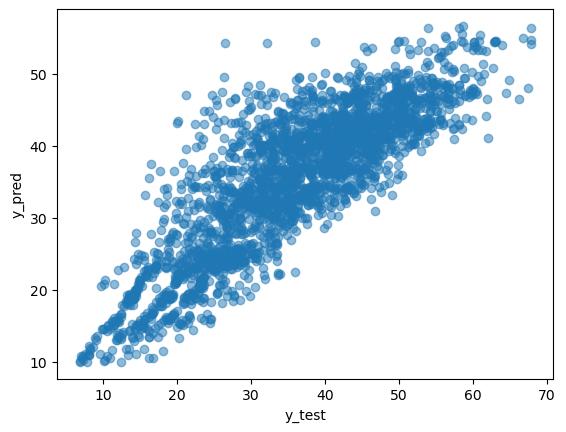

In [155]:
## plotting the final results
plt.scatter(y_test,y_pred,alpha=0.5)
plt.xlabel('y_test')
plt.ylabel('y_pred')
plt.show()

### We can see that the scatterplot is linear, therefore giving us decent predictions

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



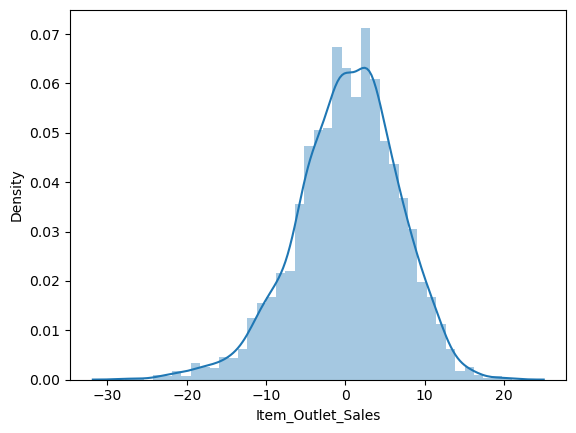

In [156]:
sns.distplot(y_test-y_pred) ## distribution between the actual values and predicted values
plt.show() 

### Distribution is normal which shows that our model is behaving pretty well

In [157]:
reg.score(X_train,y_train) ## Training accuracy

0.7191456675566571

In [158]:
reg.score(X_test,y_test) ## Test accuracy

0.7100020886892322

### Linear Regression

In [164]:
from sklearn.linear_model import LinearRegression

In [172]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [173]:
y_pred=lr.predict(X_test)

In [174]:
print('R2 score:',r2_score(y_test,y_pred))

R2 score: 0.4432553684122026


In [175]:
print('Mean squared error:',mean_squared_error(y_test,y_pred))

Mean squared error: 79.98220237103112


In [176]:
print('Mean absolute error:',mean_absolute_error(y_test,y_pred))

Mean absolute error: 7.144244896038472


In [177]:
print('Mean absolute percentage error:',mean_absolute_percentage_error(y_test,y_pred))

Mean absolute percentage error: 0.2530867806184908


### Lasso Regression

In [179]:
from sklearn.linear_model import Lasso

In [180]:
la=Lasso(alpha=0.05)
la.fit(X_train,y_train)

Lasso(alpha=0.05)

In [181]:
y_pred=la.predict(X_test)

In [182]:
print('R2 score:',r2_score(y_test,y_pred))

R2 score: 0.43478927038010795


In [183]:
print('Mean squared error:',mean_squared_error(y_test,y_pred))

Mean squared error: 81.19844609872516


In [184]:
print('Mean absolute error:',mean_absolute_error(y_test,y_pred))

Mean absolute error: 7.207054536418956


In [185]:
print('Mean absolute percentage error:',mean_absolute_percentage_error(y_test,y_pred))

Mean absolute percentage error: 0.25674542595226374


### Save the model to reuse it again

In [159]:
import pickle

In [160]:
with open('reg.pkl','wb') as f:
    pickle.dump(reg,f)

In [161]:
f.close()

In [162]:
with open('reg.pkl','rb') as f:
    model=pickle.load(f)

### Conclusion

We started with importing our train data and then finding the basic structure of the dataset. After that we have imputed missing values which are present in the dataset. As part of our EDA we have established some relationships and tried to find out the areas where BigMart can focus to increase their sales. Then we have done feature engineering, to start with we have first handled categorical features by encoding them through label encoding. We have also analyzed outliers and capped them using a maximum value and finally we have done feature transformation to transform skewed data to normal distribution

I have built a model using 3 algorithms(Random forest regressor,Linear regression and Lasso regression) to predict the outlet sales. We can see that initially the random forest regressor model is giving a r2 score of 66%, MAPE as 17% and mean squared error as 48.3, but after hyperparameter tuning we have managed to increase our r2 score to 71% and reduce the other metrics significantly. After plotting the results our predictions are linear and showed normal distribution, hence random forest is able to make pretty decent predictions. When we used linear regression our r2 score is 44% which means it is not a suitable model for prediction. Lasso regression is also giving us a low r2 score of 43%, therefore RandomForestRegressor is the best model to predict the sales at each outlet. 